In [2]:
pip install opencv-python numpy


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [12]:
import cv2
import numpy as np

class Tracker:
    def __init__(self):
        self.next_id = 0
        self.objects = {}

    def update(self, detections):
        updated = {}

        for (x,y,w,h) in detections:
            cx = x + w//2
            cy = y + h//2

            found_id = None
            for oid, (ox,oy) in self.objects.items():
                if abs(cx-ox) < 50 and abs(cy-oy) < 50:
                    found_id = oid
                    break

            if found_id is None:
                found_id = self.next_id
                self.next_id += 1

            updated[found_id] = (cx,cy)

        self.objects = updated
        return updated


video_path = r"C:\Users\rajm4\Downloads\video.mp4"
cap = cv2.VideoCapture(video_path)

tracker = Tracker()
frames_out = []

for i in range(3):  # 3 frames for figure
    ret, frame = cap.read()
    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # simple detection using threshold 
    _,thresh = cv2.threshold(gray, 200,255,cv2.THRESH_BINARY)

    contours,_ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    detections = []
    for c in contours:
        if cv2.contourArea(c) > 500:
            x,y,w,h = cv2.boundingRect(c)
            detections.append((x,y,w,h))

    objects = tracker.update(detections)

    # draw boxes + IDs
    for oid,(cx,cy) in objects.items():
        x = cx-40
        y = cy-40
        cv2.rectangle(frame,(x,y),(x+80,y+80),(0,255,0),3)
        cv2.putText(frame,f"ID {oid}",(x,y-10),
                    cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),2)

    frames_out.append(frame)

cap.release()

if len(frames_out) > 1:
    combined = cv2.hconcat(frames_out)
    cv2.imwrite("tracking_results.png", combined)
    print("tracking_results.png created")
else:
    print("Not enough frames")


tracking_results.png created


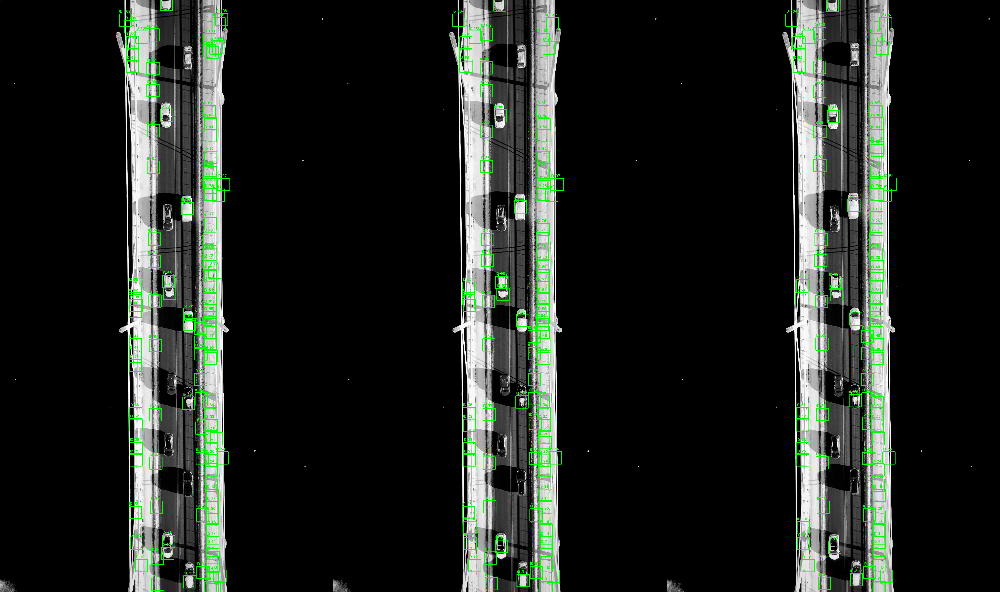

In [13]:
from IPython.display import Image, display
display(Image("tracking_results.png"))


In [14]:
import cv2
import numpy as np

class Tracker:
    def __init__(self):
        self.next_id = 0
        self.objects = {}

    def update(self, detections):
        updated = {}

        for (x,y,w,h) in detections:
            cx = x + w//2
            cy = y + h//2

            found_id = None
            for oid, (ox,oy) in self.objects.items():
                if abs(cx-ox) < 50 and abs(cy-oy) < 50:
                    found_id = oid
                    break

            if found_id is None:
                found_id = self.next_id
                self.next_id += 1

            updated[found_id] = (cx,cy)

        self.objects = updated
        return updated

video_path = r"C:\Users\rajm4\Downloads\data.mp4"
cap = cv2.VideoCapture(video_path)

tracker = Tracker()
frames_out = []

for i in range(3):  # 3 frames for figure
    ret, frame = cap.read()
    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # simple detection using threshold 
    _,thresh = cv2.threshold(gray, 200,255,cv2.THRESH_BINARY)

    contours,_ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    detections = []
    for c in contours:
        if cv2.contourArea(c) > 500:
            x,y,w,h = cv2.boundingRect(c)
            detections.append((x,y,w,h))

    objects = tracker.update(detections)

    # draw boxes + IDs
    for oid,(cx,cy) in objects.items():
        x = cx-40
        y = cy-40
        cv2.rectangle(frame,(x,y),(x+80,y+80),(0,255,0),3)
        cv2.putText(frame,f"ID {oid}",(x,y-10),
                    cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),2)

    frames_out.append(frame)

cap.release()

if len(frames_out) > 1:
    combined = cv2.hconcat(frames_out)
    cv2.imwrite("tracking_results.png", combined)
    print("tracking_results.png created")
else:
    print("Not enough frames")


tracking_results.png created


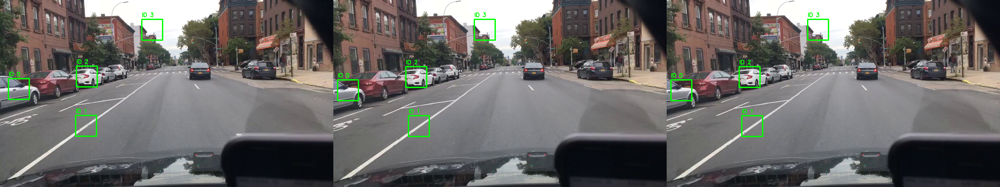

In [15]:
from IPython.display import Image, display
display(Image("tracking_results.png"))
